# Introduction to data visualisation with Plotly library package

There are 3 different approaches to display figures

<li> Using the renderers framework in the context of a script or notebook
<li> Using Dash in a web app context
<li> Using a FigureWidget in an ipywidgets context
    

https://plotly.com/python/renderers/

# Displaying Figures Using the Renderers Framework

What is a renderer framework?

In [1]:
# Display the list of all available renderers
# io means input/output

import plotly.io as pio

pio.renderers

Renderers configuration
-----------------------
    Default renderer: 'plotly_mimetype+notebook'
    Available renderers:
        ['plotly_mimetype', 'jupyterlab', 'nteract', 'vscode',
         'notebook', 'notebook_connected', 'kaggle', 'azure', 'colab',
         'cocalc', 'databricks', 'json', 'png', 'jpeg', 'jpg', 'svg',
         'pdf', 'browser', 'firefox', 'chrome', 'chromium', 'iframe',
         'iframe_connected', 'sphinx_gallery']

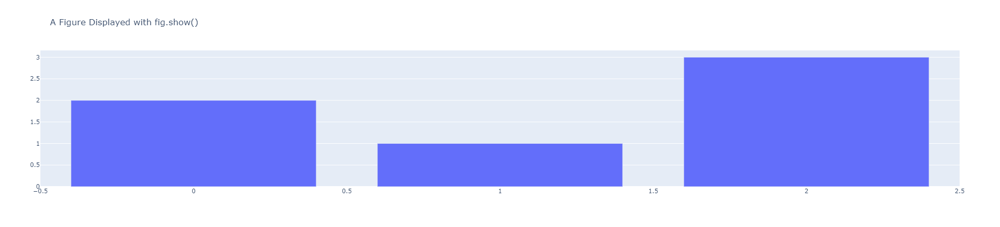

In [2]:
# To dispay a figure using the renderers framework, the .show() method is used

import plotly.graph_objects as go

fig = go.Figure(data=[go.Bar(y=[2, 1, 3])], layout_title_text="A Figure Displayed with fig.show()")

fig.show()

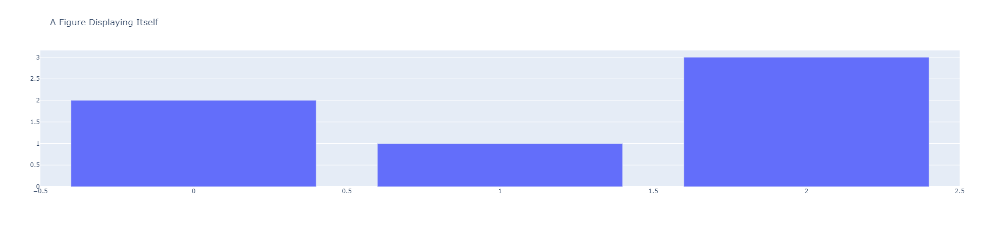

In [3]:
# In most cases, the .show() can be omitted to display the figure directly

import plotly.graph_objects as go

fig = go.Figure(data=[go.Bar(y=[2, 1, 3])], layout_title_text="A Figure Displaying Itself")

fig

# Iris flower dataset

In [4]:
import plotly.express as px
print(px.data.iris.__doc__)
px.data.iris().head()


Each row represents a flower.

https://en.wikipedia.org/wiki/Iris_flower_data_set

Returns:
    A `pandas.DataFrame` with 150 rows and the following columns:
    `['sepal_length', 'sepal_width', 'petal_length', 'petal_width', 'species', 'species_id']`.



,sepal_length,sepal_width,petal_length,petal_width,species,species_id
0,5.1,3.5,1.4,0.2,setosa,1
1,4.9,3.0,1.4,0.2,setosa,1
2,4.7,3.2,1.3,0.2,setosa,1
3,4.6,3.1,1.5,0.2,setosa,1
4,5.0,3.6,1.4,0.2,setosa,1


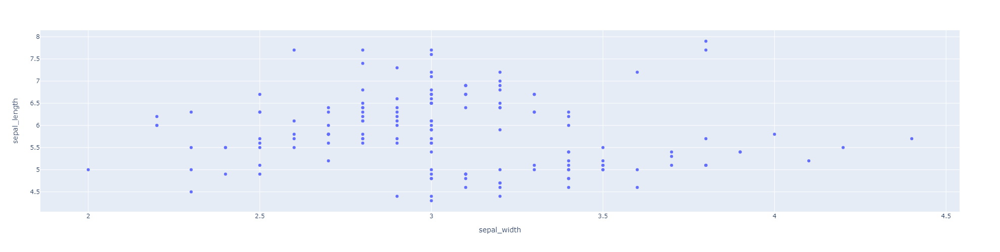

In [5]:
import plotly.express as px
df = px.data.iris()
fig = px.scatter(df, x="sepal_width", y="sepal_length", width = 500, height = 500)
fig.show()

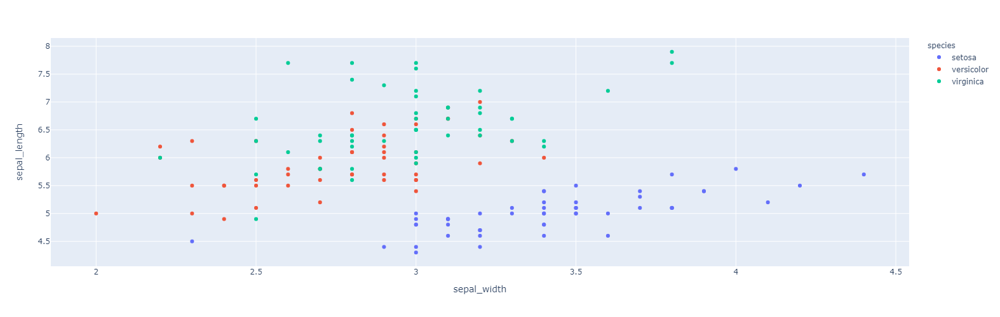

In [24]:
# Add colour 

import plotly.express as px
df = px.data.iris()
fig = px.scatter(df, x="sepal_width", y="sepal_length", color="species",  width = 500, height = 500)
fig.show()

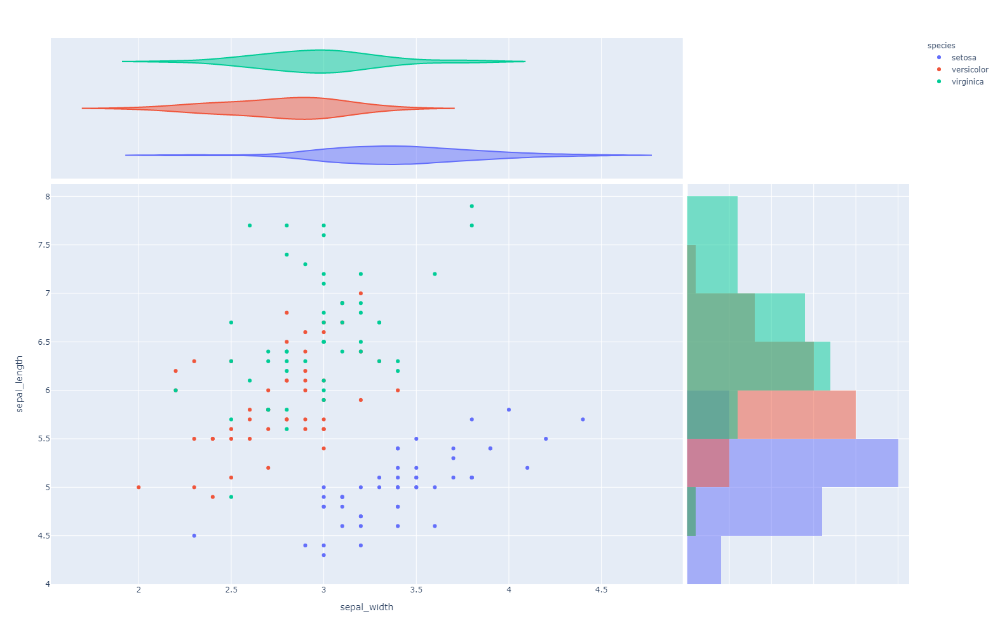

In [42]:
# Plot with different styles - rug, box, violin, or histogram

import plotly.express as px
df = px.data.iris()
fig = px.scatter(df, x="sepal_width", y="sepal_length", color="species", marginal_y="histogram", marginal_x="violin", width = 1000, height = 1000)
fig

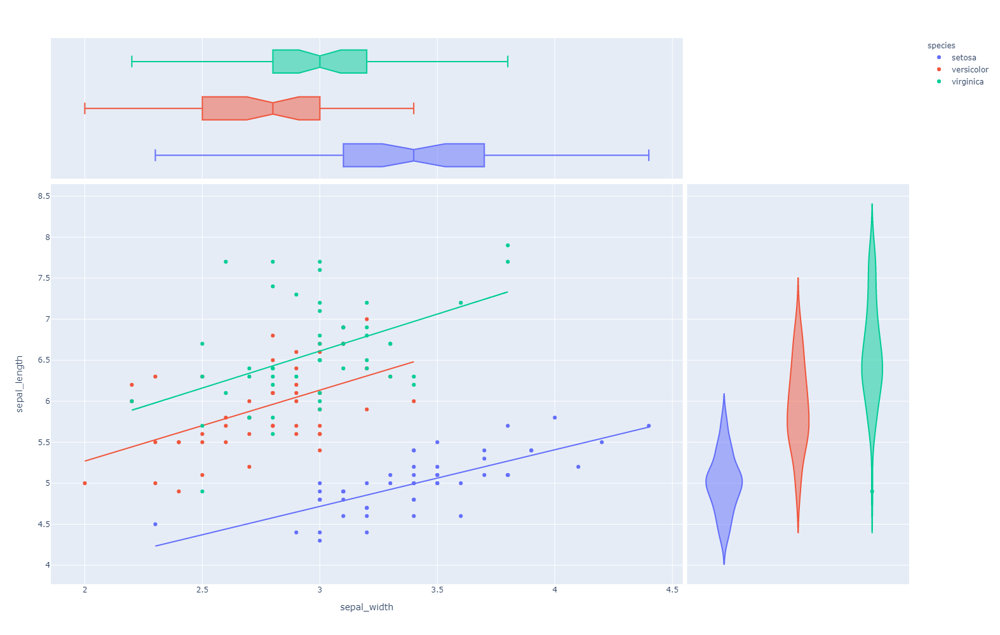

In [40]:
# Adding a trendline One of `'ols'` or `'lowess'`. If `'ols'`, an Ordinary Least Squares regression line will be drawn for each discrete-color/symbol group.
# If 'lowess', a Locally Weighted Scatterplot Smoothing line will be drawn for each discrete-color/symbol group.

import plotly.express as px
df = px.data.iris()
fig = px.scatter(df, x="sepal_width", y="sepal_length", color="species", marginal_y="violin", marginal_x="box", trendline="ols",width = 1000, height = 1000)
fig.show()

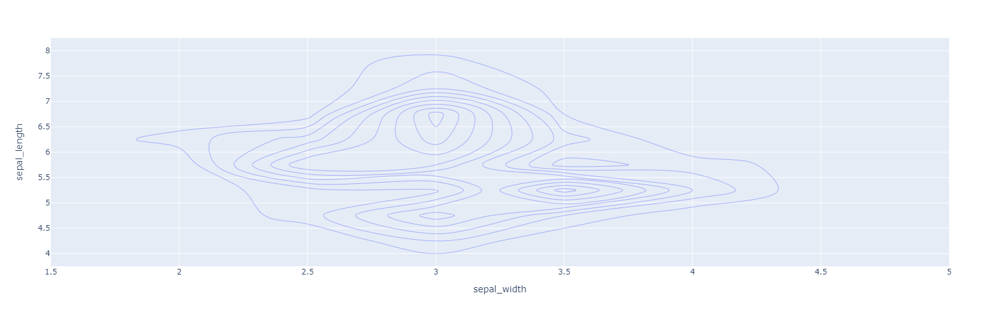

In [87]:
# Plot density contours

import plotly.express as px
df = px.data.iris()
fig = px.density_contour(df, x="sepal_width", y="sepal_length", width = 500, height = 500)
fig.show()

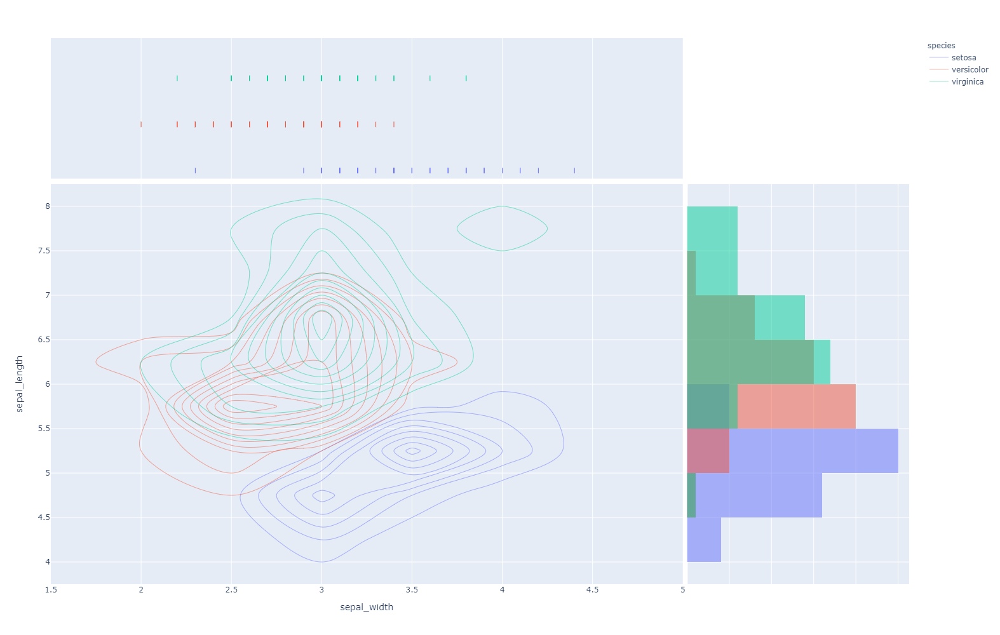

In [89]:
# Plot density contours with colours
import plotly.express as px
df = px.data.iris()
fig = px.density_contour(df, x="sepal_width", y="sepal_length", color="species", marginal_x="rug", marginal_y="histogram",  width = 1000, height = 1000)
fig.show()

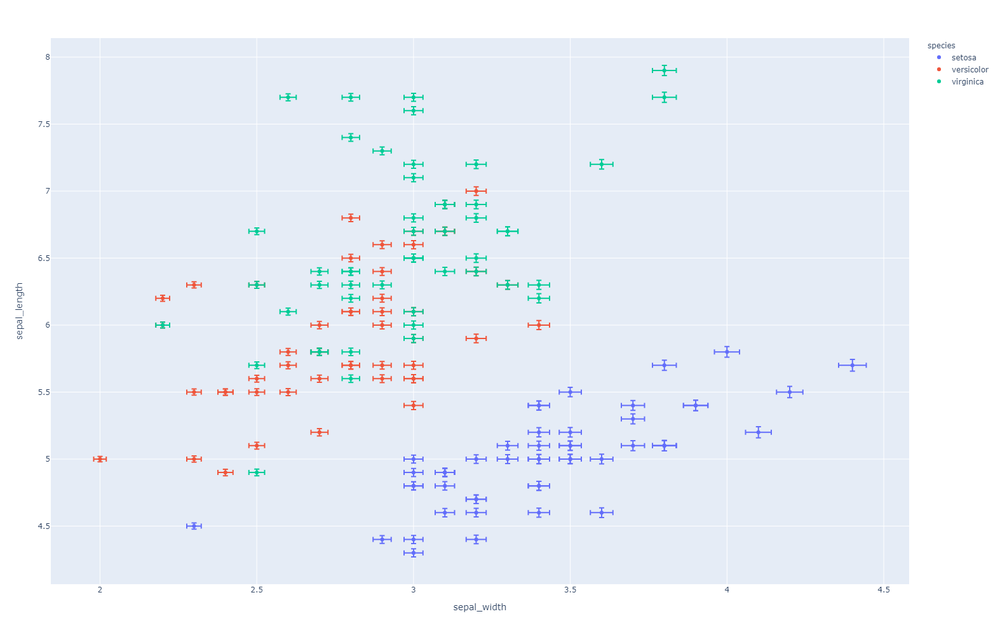

In [44]:
# Adding error bars

import plotly.express as px
df = px.data.iris()
df["e"] = df["sepal_width"]/100 #Setting the error to be a fraction of the sepal_width
fig = px.scatter(df, x="sepal_width", y="sepal_length", color="species", error_x="e", error_y="e", width = 1000, height = 1000)
fig.show()

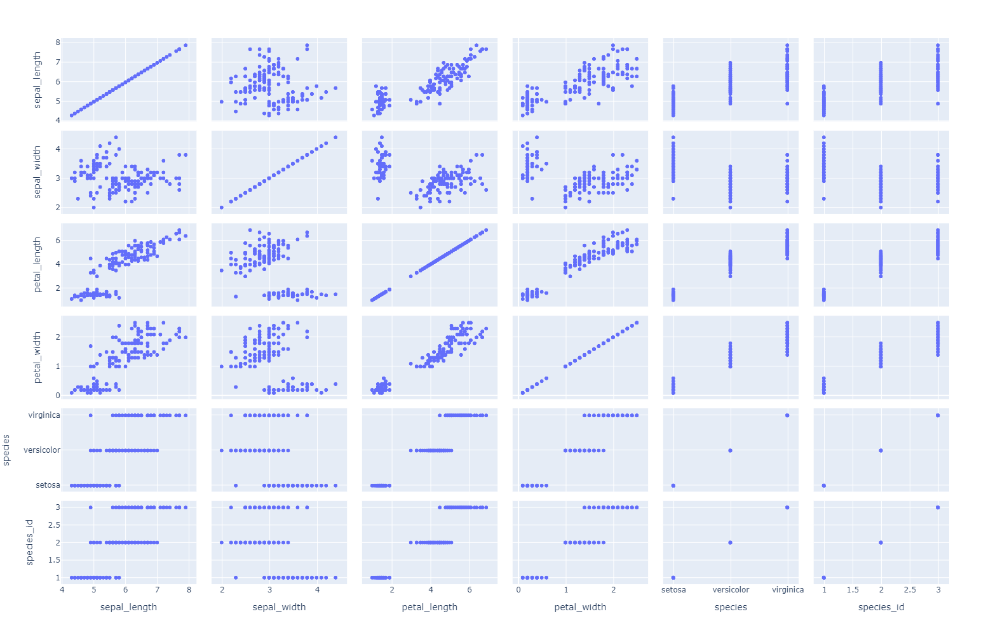

In [53]:
# Scatterplot

import plotly.express as px
df = px.data.iris()
fig = px.scatter_matrix(df,  width = 1000, height = 1000)
fig.show()

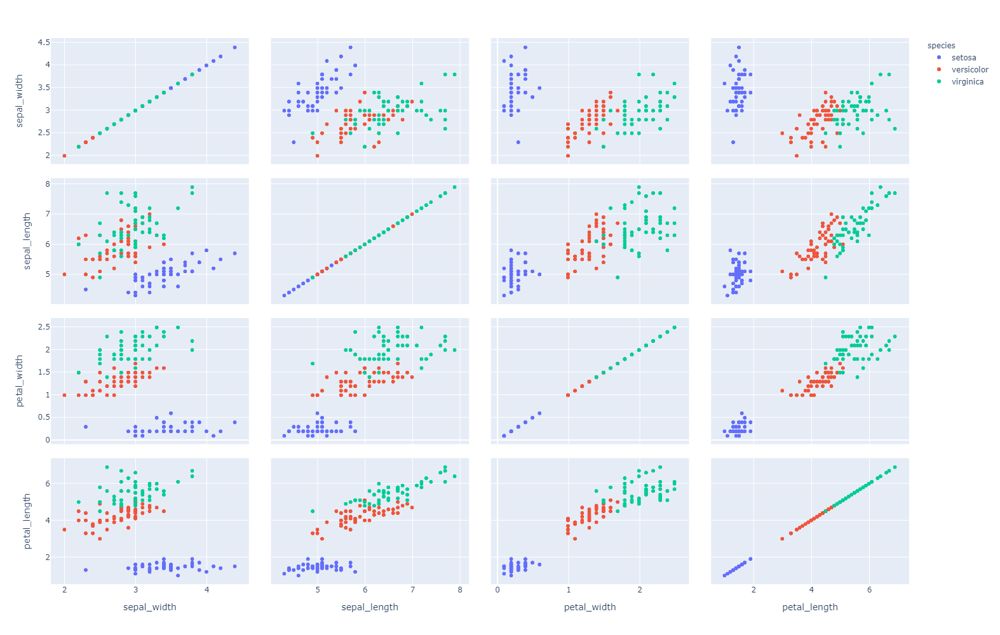

In [55]:
# add dimensions and colour

import plotly.express as px
df = px.data.iris()
fig = px.scatter_matrix(df, dimensions=["sepal_width", "sepal_length", "petal_width", "petal_length"], color="species", width = 1000, height = 1000)
fig.show()

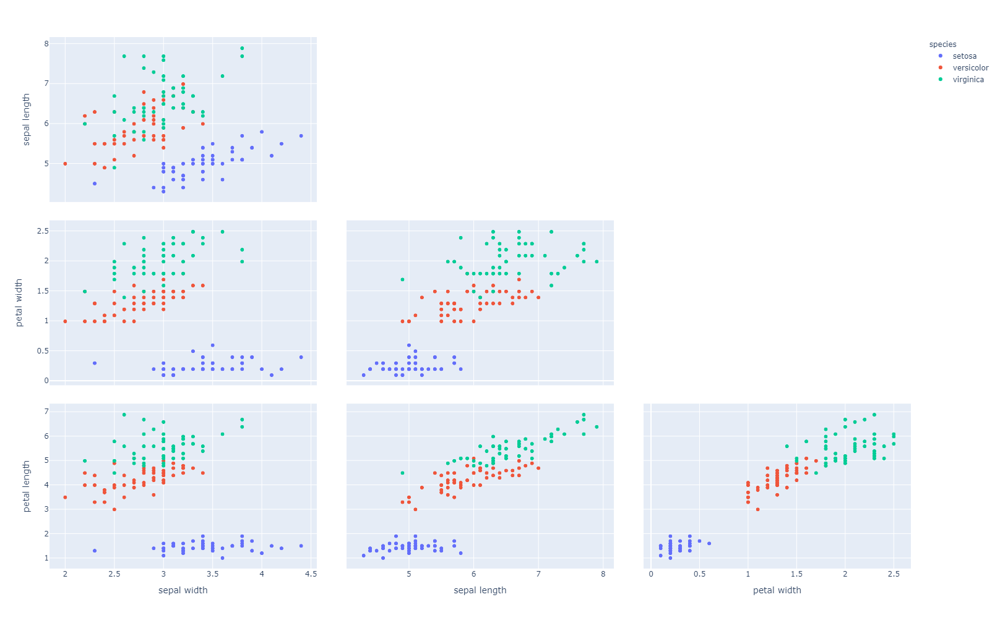

In [5]:
# replace _ with spaces and hide the diagonals, hide repeated upper halves

import plotly.express as px
df = px.data.iris()
fig = px.scatter_matrix(df, 
                        dimensions=["sepal_width", "sepal_length", "petal_width", "petal_length"], 
                        color="species",  
                        width = 1000, 
                        height = 1000,
                        labels={col:col.replace('_', ' ') for col in df.columns}) # remove underscore from titles

fig.update_traces(showupperhalf = False, diagonal_visible=False) # hide diagonals

fig.show()

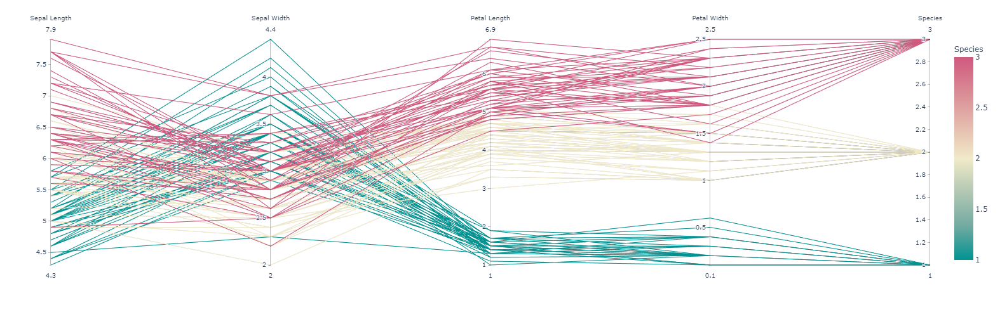

In [90]:
# ??? What kind of plot is this

import plotly.express as px
df = px.data.iris()
fig = px.parallel_coordinates(df, color="species_id", labels={"species_id": "Species",
                  "sepal_width": "Sepal Width", "sepal_length": "Sepal Length",
                  "petal_width": "Petal Width", "petal_length": "Petal Length", },
                    color_continuous_scale=px.colors.diverging.Tealrose, color_continuous_midpoint=2, width = 500, height = 500)
fig.show()

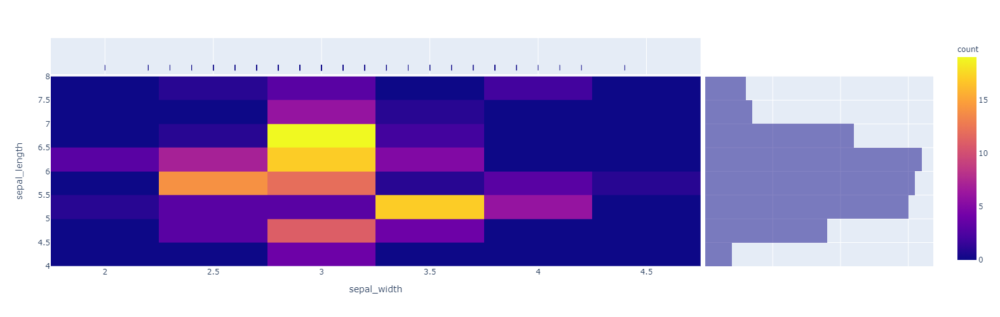

In [92]:
# Heatmaps

import plotly.express as px
df = px.data.iris()
fig = px.density_heatmap(df, x="sepal_width", y="sepal_length", marginal_x="rug", marginal_y="histogram", width = 500, height = 500)
fig.show()

# Data tips dataset

     total_bill   tip     sex smoker   day    time  size
0         16.99  1.01  Female     No   Sun  Dinner     2
1         10.34  1.66    Male     No   Sun  Dinner     3
2         21.01  3.50    Male     No   Sun  Dinner     3
3         23.68  3.31    Male     No   Sun  Dinner     2
4         24.59  3.61  Female     No   Sun  Dinner     4
..          ...   ...     ...    ...   ...     ...   ...
239       29.03  5.92    Male     No   Sat  Dinner     3
240       27.18  2.00  Female    Yes   Sat  Dinner     2
241       22.67  2.00    Male    Yes   Sat  Dinner     2
242       17.82  1.75    Male     No   Sat  Dinner     2
243       18.78  3.00  Female     No  Thur  Dinner     2

[244 rows x 7 columns]


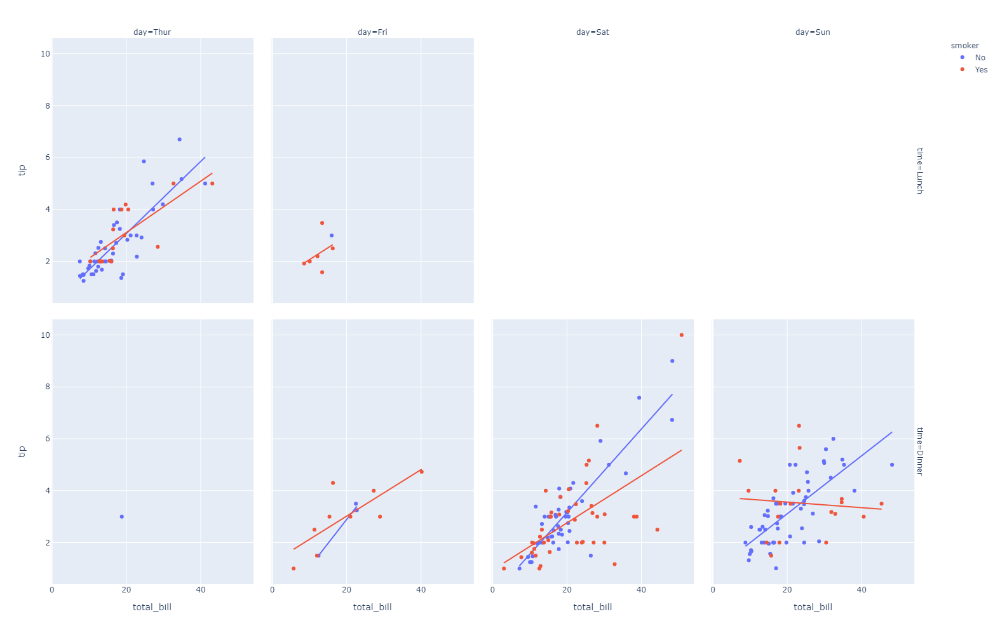

In [73]:
# Mutiple plots based on time and day

import plotly.express as px
df = px.data.tips()
fig = px.scatter(df, x="total_bill", y="tip", facet_row="time", facet_col="day", color="smoker", trendline="ols", category_orders={"day": ["Thur", "Fri", "Sat", "Sun"], "time": ["Lunch", "Dinner"]}, width = 1000, height = 1000)
print(df)
fig.show()

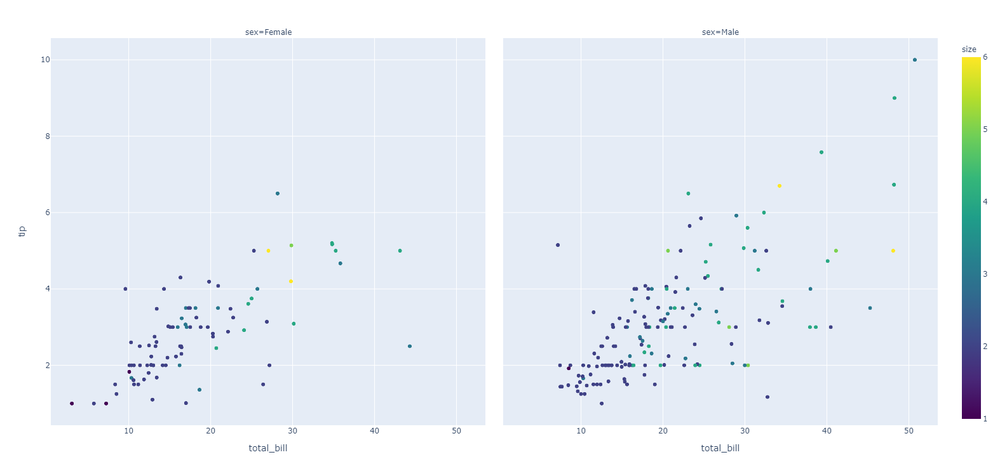

In [68]:
import plotly.express as px
df = px.data.tips()
fig = px.scatter(df, x="total_bill", y="tip", color="size", facet_col="sex", color_continuous_scale=px.colors.sequential.Viridis, render_mode="webgl", width = 1000, height = 750)
fig.show()

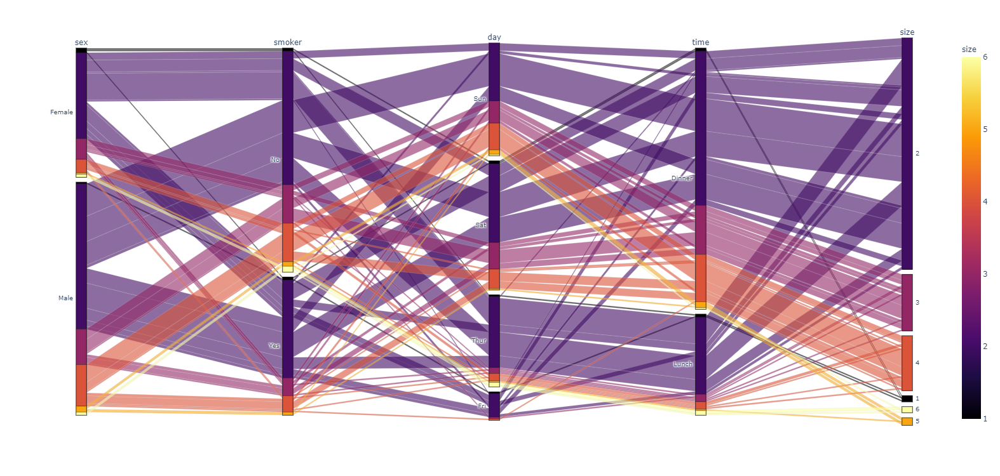

In [60]:
# Categorical plot

import plotly.express as px
df = px.data.tips()
fig = px.parallel_categories(df, color="size", color_continuous_scale=px.colors.sequential.Inferno, width = 1000, height = 750)
fig.show()

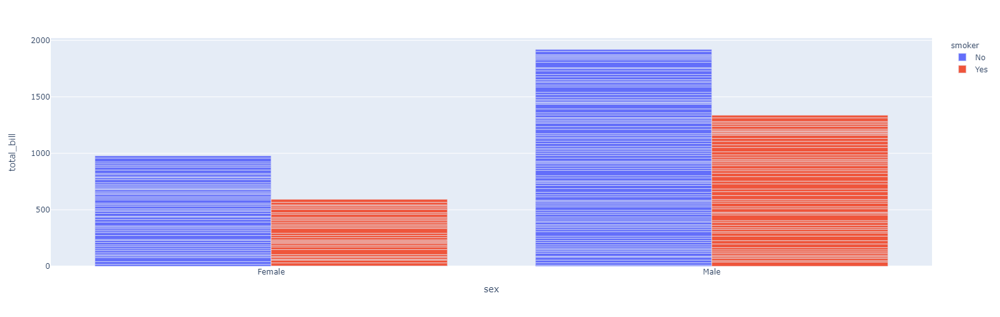

In [99]:
# Group seperately based on the colour

import plotly.express as px
df = px.data.tips()
fig = px.bar(df, x="sex", y="total_bill", color="smoker", barmode="group", width = 500, height = 500)
fig.show()

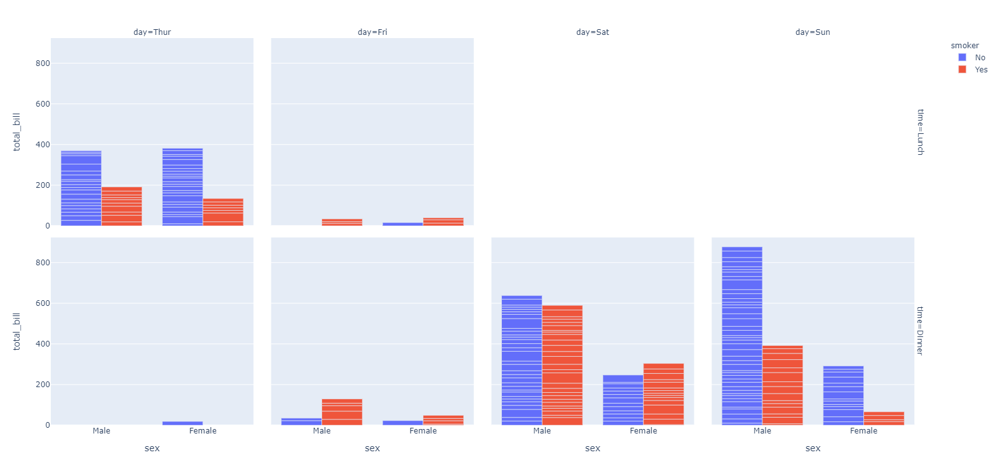

In [103]:
import plotly.express as px
df = px.data.tips()
fig = px.bar(df, x="sex", y="total_bill", color="smoker", barmode="group", facet_row="time", facet_col="day", category_orders={"day": ["Thur", "Fri", "Sat", "Sun"], "time": ["Lunch", "Dinner"]}, width = 1000, height = 750)
fig.show()

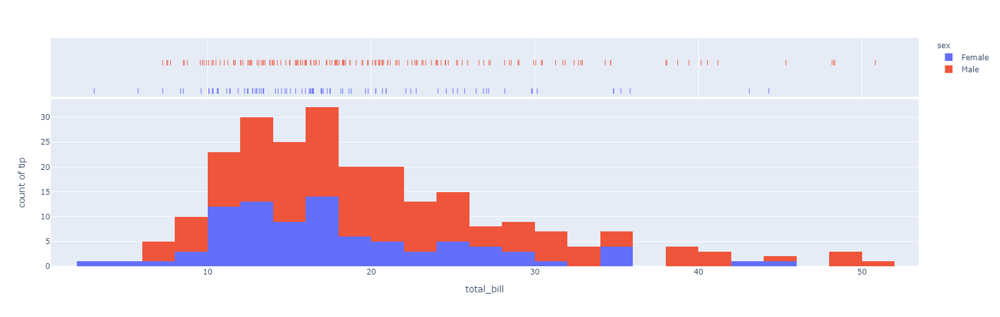

In [108]:
# histogram

import plotly.express as px
df = px.data.tips()
fig = px.histogram(df, x="total_bill", y="tip", color="sex", marginal="rug", hover_data=df.columns, width = 500, height = 500)
fig.show()

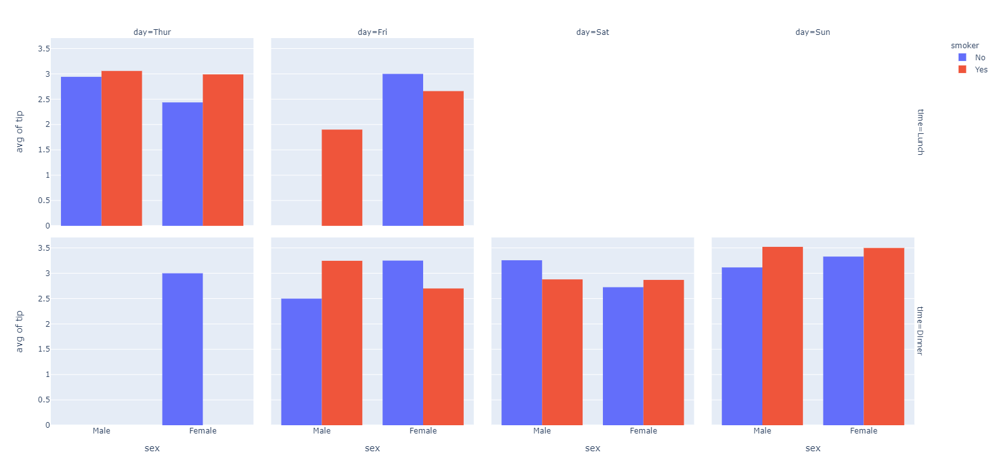

In [110]:
# Plot average histogram

import plotly.express as px
df = px.data.tips()
fig = px.histogram(df, x="sex", y="tip", histfunc="avg", color="smoker", barmode="group", facet_row="time", facet_col="day", category_orders={"day": ["Thur", "Fri", "Sat", "Sun"], "time": ["Lunch", "Dinner"]}, width = 1000, height = 750)
fig.show()

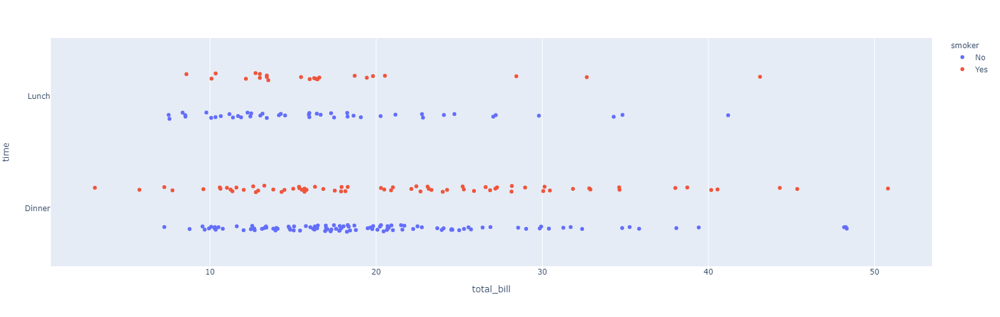

In [118]:
import plotly.express as px
df = px.data.tips()
fig = px.strip(df, x="total_bill", y="time", orientation="h", color="smoker", width = 500, height = 500)
fig.show()

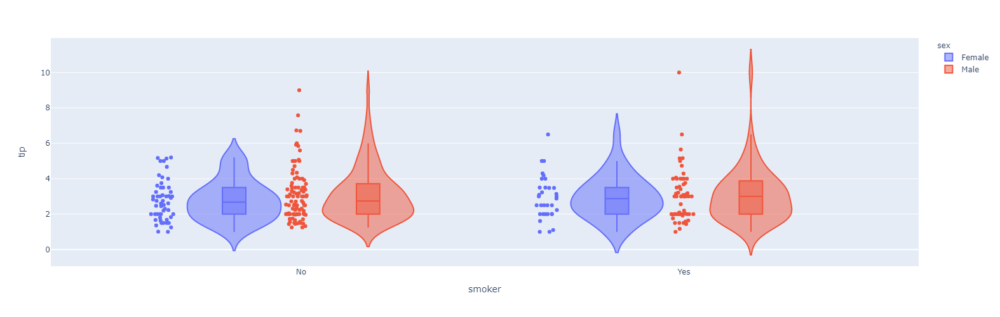

In [121]:
import plotly.express as px
df = px.data.tips()
fig = px.violin(df, y="tip", x="smoker", color="sex", box=True, points="all", hover_data=df.columns, width = 750, height = 500)
fig.show()

# Gapminder dataset

          country continent  year  lifeExp       pop   gdpPercap iso_alpha  \
0     Afghanistan      Asia  1952   28.801   8425333  779.445314       AFG   
1     Afghanistan      Asia  1957   30.332   9240934  820.853030       AFG   
2     Afghanistan      Asia  1962   31.997  10267083  853.100710       AFG   
3     Afghanistan      Asia  1967   34.020  11537966  836.197138       AFG   
4     Afghanistan      Asia  1972   36.088  13079460  739.981106       AFG   
...           ...       ...   ...      ...       ...         ...       ...   
1699     Zimbabwe    Africa  1987   62.351   9216418  706.157306       ZWE   
1700     Zimbabwe    Africa  1992   60.377  10704340  693.420786       ZWE   
1701     Zimbabwe    Africa  1997   46.809  11404948  792.449960       ZWE   
1702     Zimbabwe    Africa  2002   39.989  11926563  672.038623       ZWE   
1703     Zimbabwe    Africa  2007   43.487  12311143  469.709298       ZWE   

      iso_num  
0           4  
1           4  
2           4  

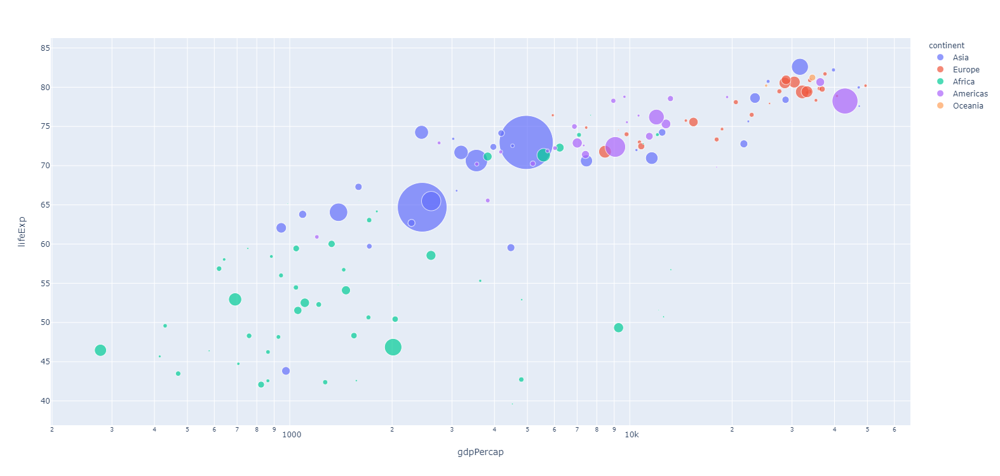

In [74]:
df = px.data.gapminder()
fig = px.scatter(df.query("year==2007"), x="gdpPercap", y="lifeExp", size="pop", color="continent",  hover_name="country", log_x=True, size_max=60, width = 1000, height = 750)
print(df)
fig.show()

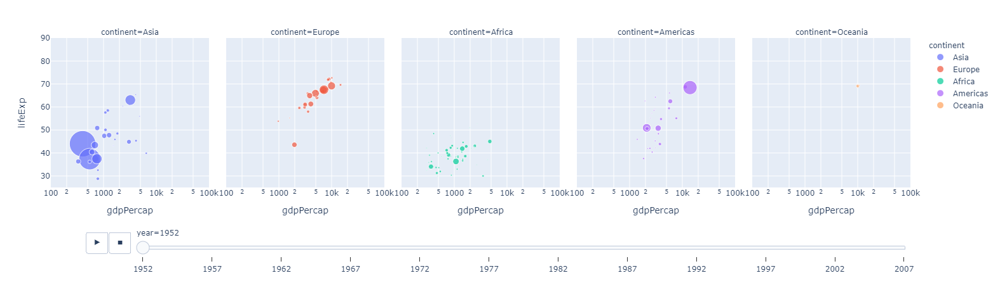

In [82]:
# Year by year transition animation

import plotly.express as px
df = px.data.gapminder()
fig = px.scatter(df, x="gdpPercap", y="lifeExp", animation_frame="year", animation_group="country", size="pop", color="continent", hover_name="country", facet_col="continent", log_x=True, size_max=45, range_x=[100,100000], range_y=[25,90])
fig.show()
fig.write_html("file.html")

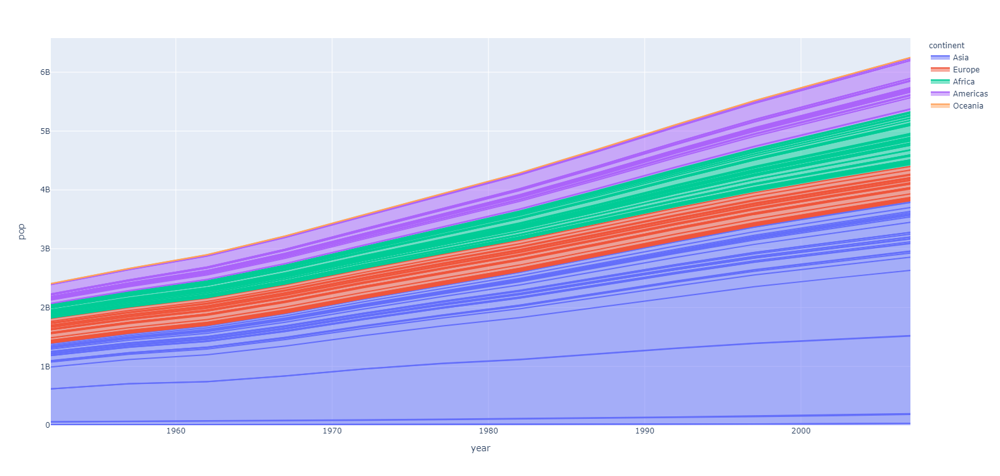

In [85]:
import plotly.express as px
df = px.data.gapminder()
fig = px.area(df, x="year", y="pop", color="continent", line_group="country", width = 1000, height = 750)
fig.show()

                                             district  Coderre  Bergeron  \
0                                  101-Bois-de-Liesse     2481      1829   
1                               102-Cap-Saint-Jacques     2525      1163   
2                                11-Sault-au-Récollet     3348      2770   
3                                        111-Mile-End     1734      4782   
4                                      112-DeLorimier     1770      5933   
5                                    113-Jeanne-Mance     1455      3599   
6                                    12-Saint-Sulpice     3252      2521   
7                          121-La Pointe-aux-Prairies     5456      1760   
8                             122-Pointe-aux-Trembles     4734      1879   
9                            123-Rivière-des-Prairies     5737       958   
10                                        13-Ahuntsic     2979      3430   
11                                  131-Saint-Édouard     1827      6408   
12          

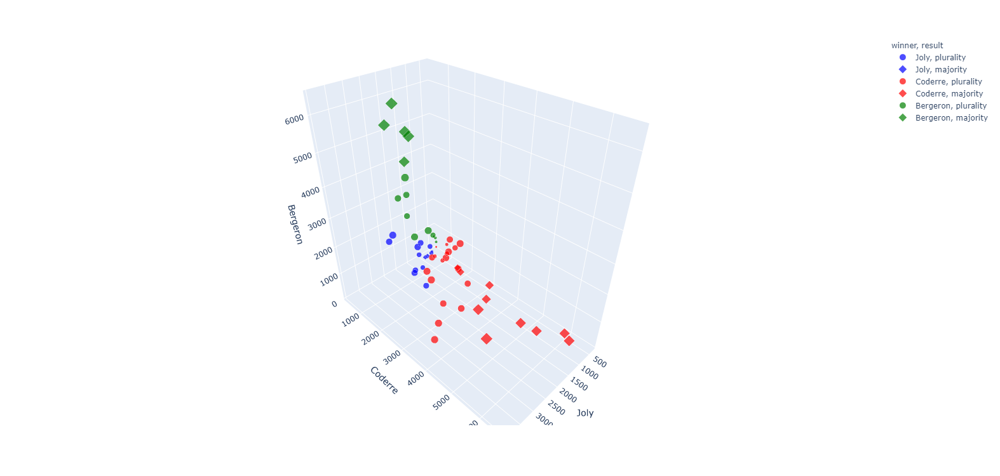

In [146]:
# 3D coordinates

import plotly.express as px
df = px.data.election()
fig = px.scatter_3d(df, x="Joly", y="Coderre", z="Bergeron", color="winner", size="total", hover_name="district", symbol="result", color_discrete_map = {"Joly": "blue", "Bergeron": "green", "Coderre":"red"}, width = 1000, height = 750)
print(df)
fig.show()

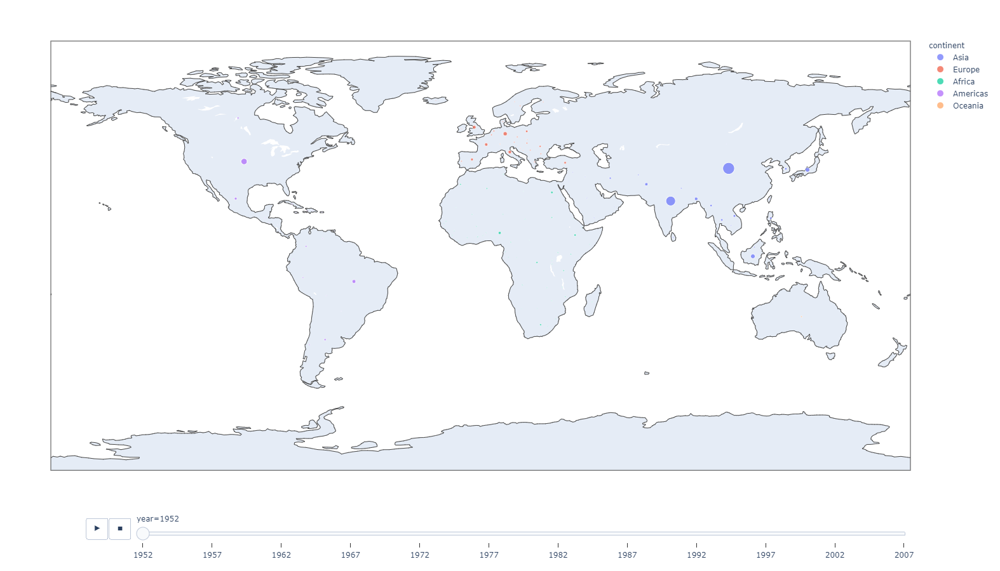

In [156]:
# Scatter geo plot

import plotly.express as px
df = px.data.gapminder()
fig = px.scatter_geo(df, locations="iso_alpha", color="continent", hover_name="country", size="pop",  animation_frame="year", projection="equirectangular")
fig.show()

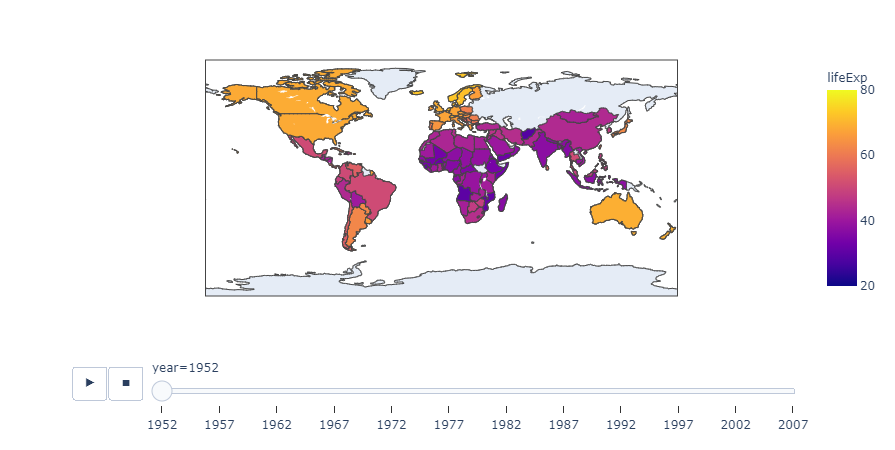

In [157]:
# Life expectancy plot

import plotly.express as px
df = px.data.gapminder()
fig = px.choropleth(df, locations="iso_alpha", color="lifeExp", hover_name="country", animation_frame="year", range_color=[20,80])
fig.show()

In [160]:
df

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Afghanistan,Asia,1952,28.801,8425333,779.445314,AFG,4
1,Afghanistan,Asia,1957,30.332,9240934,820.853030,AFG,4
2,Afghanistan,Asia,1962,31.997,10267083,853.100710,AFG,4
3,Afghanistan,Asia,1967,34.020,11537966,836.197138,AFG,4
4,Afghanistan,Asia,1972,36.088,13079460,739.981106,AFG,4
...,...,...,...,...,...,...,...,...
1699,Zimbabwe,Africa,1987,62.351,9216418,706.157306,ZWE,716
1700,Zimbabwe,Africa,1992,60.377,10704340,693.420786,ZWE,716
1701,Zimbabwe,Africa,1997,46.809,11404948,792.449960,ZWE,716
1702,Zimbabwe,Africa,2002,39.989,11926563,672.038623,ZWE,716


# Plotting with maps

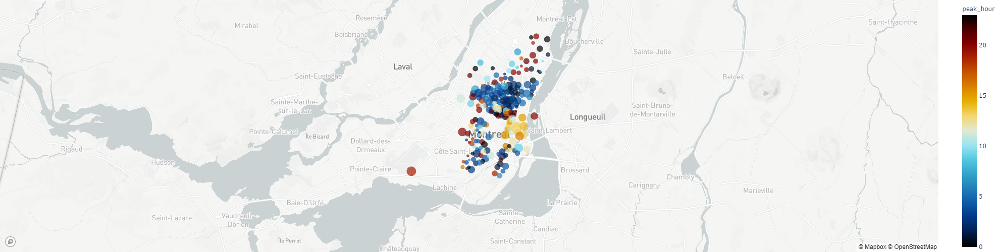

In [140]:
# Plot maps with mapbox access token

import plotly.express as px
px.set_mapbox_access_token("pk.eyJ1IjoiYWxpc3RhaXJqa2hvIiwiYSI6ImNrOTF1NnA1YzAxOW8zc3F4MXAzYm5uZXgifQ.jHOrtn3k0fhKTqKp5qLe6g")
df = px.data.carshare()
fig = px.scatter_mapbox(df, lat="centroid_lat", lon="centroid_lon", color="peak_hour", size="car_hours",  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10, width = 1000, height = 500)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

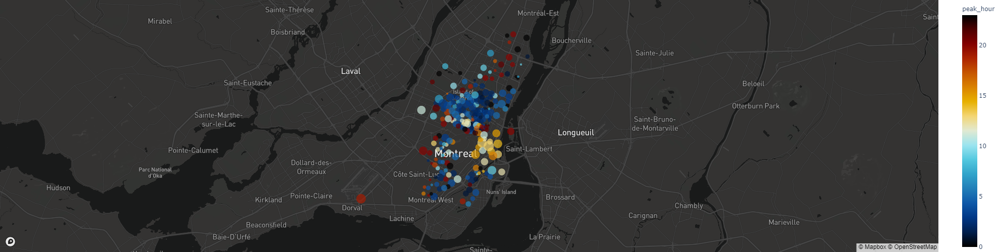

In [144]:
# Dark tiles Mapbox

import plotly.express as px
px.set_mapbox_access_token("pk.eyJ1IjoiYWxpc3RhaXJqa2hvIiwiYSI6ImNrOTF1NnA1YzAxOW8zc3F4MXAzYm5uZXgifQ.jHOrtn3k0fhKTqKp5qLe6g")
df = px.data.carshare()
fig = px.scatter_mapbox(df, lat="centroid_lat", lon="centroid_lon", color="peak_hour", size="car_hours",  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10, width = 1000, height = 500)
fig.update_layout(mapbox_style="dark")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

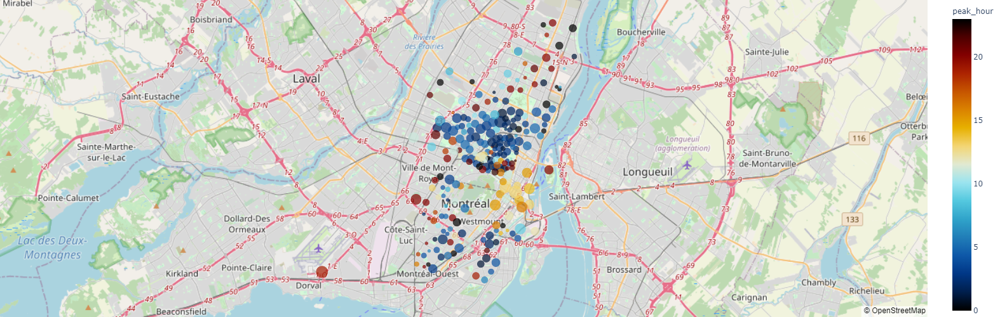

In [141]:
# Plot maps with OpenStreetMap tiles

import plotly.express as px

df = px.data.carshare()
fig = px.scatter_mapbox(df, lat="centroid_lat", lon="centroid_lon", color="peak_hour", size="car_hours",  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10, width = 1000, height = 500)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()